<a href="https://colab.research.google.com/github/escuccim/pytorch-face-autoencoder/blob/master/eas7_faces_5_gan_var.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Adding some longer residual connections to try to preserve some small details which seem to be getting lost; added batch norm; replaced 6x5 convolution with global average pool followed by 1x1 convolution.

Added a discriminator and training as a GAN (but still with autoencoder) to see if that improves the results. Also switched to variational autoencoder, with slight changes to architecture to keep model from getting too big. Training from scratch.

In [0]:
import torch
import torchvision
from torch.utils.data import DataLoader
from matplotlib import pyplot as plt
%matplotlib inline
import zipfile
import os

In [0]:
from google.colab import auth
auth.authenticate_user()

In [0]:
# upload checkpoint to GCS
project_id = 'mammography-198911'
bucket_name = 'pneumonia'

!gcloud config set project {project_id}

Updated property [core/project].


To take a quick anonymous survey, run:
  $ gcloud alpha survey



In [0]:
# !gsutil cp gs://{bucket_name}/model_30.pt ./gen_model_5.pt 
!gsutil cp gs://{bucket_name}/gen_model_5_var0.pt ./gen_model_5_var.pt 
# !gsutil cp gs://{bucket_name}/disc_model_4_var1.pt ./disc_model_4_var.pt

Copying gs://pneumonia/gen_model_5_var0.pt...
| [1 files][422.9 MiB/422.9 MiB]                                                
Operation completed over 1 objects/422.9 MiB.                                    


In [0]:
if not os.path.exists("celeba-dataset.zip"):
#   !kaggle datasets download -d jessicali9530/celeba-dataset
  !gsutil cp gs://{bucket_name}/celeba-dataset.zip ./celeba-dataset.zip
  zip_ref = zipfile.ZipFile('celeba-dataset.zip', 'r')
  zip_ref.extractall('data')
  zip_ref.close()

  zip_ref = zipfile.ZipFile('data/img_align_celeba.zip', 'r')
  zip_ref.extractall('data/images')
  zip_ref.close()

Copying gs://pneumonia/celeba-dataset.zip...
/ [1 files][  1.2 GiB/  1.2 GiB]  104.7 MiB/s                                   
Operation completed over 1 objects/1.2 GiB.                                      


In [0]:
if not os.path.exists("Training_Pictures.zip"):
  !wget https://s3.eu-west-3.amazonaws.com/deep.skoo.ch/Training_Pictures.zip
  zip_ref = zipfile.ZipFile('Training_Pictures.zip', 'r')
  zip_ref.extractall('data/images')
  zip_ref.close()

--2019-05-29 05:04:10--  https://s3.eu-west-3.amazonaws.com/deep.skoo.ch/Training_Pictures.zip
Resolving s3.eu-west-3.amazonaws.com (s3.eu-west-3.amazonaws.com)... 52.95.154.1
Connecting to s3.eu-west-3.amazonaws.com (s3.eu-west-3.amazonaws.com)|52.95.154.1|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1073596 (1.0M) [application/zip]
Saving to: ‘Training_Pictures.zip’

Training_Pictures.z 100%[===================>]   1.02M  --.-KB/s    in 0.08s   

2019-05-29 05:04:10 (13.1 MB/s) - ‘Training_Pictures.zip’ saved [1073596/1073596]



In [0]:

if not os.path.exists("imdb_images3.zip"):  
  !gsutil cp gs://{bucket_name}/imdb_images3.zip ./imdb_images3.zip
  zip_ref = zipfile.ZipFile('imdb_images3.zip', 'r')
  zip_ref.extractall('data/images')
  zip_ref.close()
  
if not os.path.exists("crop_part1.tar.gz"):
  !gsutil cp gs://{bucket_name}/crop_part1.tar.gz ./crop_part1.tar.gz
  !tar -xf crop_part1.tar.gz -C data/images

Copying gs://pneumonia/imdb_images3.zip...
/ [1 files][  1.5 GiB/  1.5 GiB]  131.0 MiB/s                                   
Operation completed over 1 objects/1.5 GiB.                                      
Copying gs://pneumonia/crop_part1.tar.gz...
- [1 files][ 43.3 MiB/ 43.3 MiB]                                                
Operation completed over 1 objects/43.3 MiB.                                     


In [0]:
# get test data
# if not os.path.exists("faces94.zip"):
#   !wget https://cswww.essex.ac.uk/mv/allfaces/faces94.zip
#   zip_ref = zipfile.ZipFile('faces94.zip', 'r')
#   zip_ref.extractall('data/test_images')
#   zip_ref.close()
  
# if not os.path.exists("faces96.zip"):
#   !wget https://cswww.essex.ac.uk/mv/allfaces/faces96.zip  
#   zip_ref = zipfile.ZipFile('faces96.zip', 'r')
#   zip_ref.extractall('data/test_images')
#   zip_ref.close()

if not os.path.exists("wiki_images2.zip"):
  !gsutil cp gs://{bucket_name}/wiki_images2.zip ./wiki_images.zip
  zip_ref = zipfile.ZipFile('wiki_images.zip', 'r')
  zip_ref.extractall('data/test_images')
  zip_ref.close()

if not os.path.exists("faces95.zip"):
  !wget https://cswww.essex.ac.uk/mv/allfaces/faces95.zip  
  zip_ref = zipfile.ZipFile('faces95.zip', 'r')
  zip_ref.extractall('data/test_images')
  zip_ref.close()
  
if not os.path.exists("GWB_200x200_JPEG.zip"):
  !wget https://s3.eu-west-3.amazonaws.com/deep.skoo.ch/GWB_200x200_JPEG.zip
  zip_ref = zipfile.ZipFile('GWB_200x200_JPEG.zip', 'r')
  zip_ref.extractall('data/test_images')
  zip_ref.close()    

Copying gs://pneumonia/wiki_images2.zip...
| [1 files][160.5 MiB/160.5 MiB]                                                
Operation completed over 1 objects/160.5 MiB.                                    
--2019-05-29 05:05:34--  https://cswww.essex.ac.uk/mv/allfaces/faces95.zip
Resolving cswww.essex.ac.uk (cswww.essex.ac.uk)... 155.245.92.179
Connecting to cswww.essex.ac.uk (cswww.essex.ac.uk)|155.245.92.179|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6425534 (6.1M) [application/zip]
Saving to: ‘faces95.zip’

faces95.zip         100%[===================>]   6.13M  36.7MB/s    in 0.2s    

2019-05-29 05:05:35 (36.7 MB/s) - ‘faces95.zip’ saved [6425534/6425534]

--2019-05-29 05:05:36--  https://s3.eu-west-3.amazonaws.com/deep.skoo.ch/GWB_200x200_JPEG.zip
Resolving s3.eu-west-3.amazonaws.com (s3.eu-west-3.amazonaws.com)... 52.95.155.9
Connecting to s3.eu-west-3.amazonaws.com (s3.eu-west-3.amazonaws.com)|52.95.155.9|:443... connected.
HTTP request sent, awai

In [0]:
BATCH_SIZE = 48
data_path = "data/images"

transform = torchvision.transforms.Compose(
    [torchvision.transforms.RandomHorizontalFlip(p=0.5), 
      torchvision.transforms.RandomApply([
        torchvision.transforms.RandomAffine(degrees=7, translate=(0.05,0.05), scale=(0.9,1.1), shear=3, resample=False, fillcolor=0),        
      ], 0.6),
      torchvision.transforms.RandomResizedCrop((192,160), scale=(0.8, 1.20)),
      torchvision.transforms.ToTensor(),
    ])

transform2 = torchvision.transforms.Compose(
    [torchvision.transforms.RandomResizedCrop((192,160), scale=(0.95, 1.05)),
      torchvision.transforms.ToTensor(),
    ])

train_dataset = torchvision.datasets.ImageFolder(
        root=data_path,
        transform=transform
    )

train_loader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    num_workers=2,
    shuffle=True
)

test_dataset = torchvision.datasets.ImageFolder(
        root="data/test_images",
        transform=transform2
    )

test_loader = torch.utils.data.DataLoader(
    test_dataset,
    batch_size=32,
    num_workers=1,
    shuffle=True
)

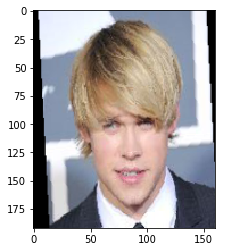

In [0]:
for (images, _) in train_loader:
  plt.imshow(images[0].permute(1,2,0))
  plt.show()
  break

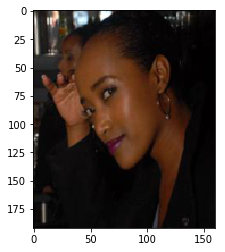

In [0]:
for (images, _) in test_loader:
  plt.imshow(images[0].permute(1,2,0))
  plt.show()
  break

In [0]:
train_dataset

Dataset ImageFolder
    Number of datapoints: 387695
    Root Location: data/images
    Transforms (if any): Compose(
                             RandomHorizontalFlip(p=0.5)
                             RandomApply(
                             p=0.6
                             RandomAffine(degrees=(-7, 7), translate=(0.05, 0.05), scale=(0.9, 1.1), shear=(-3, 3))
                         )
                             RandomResizedCrop(size=(192, 160), scale=(0.8, 1.2), ratio=(0.75, 1.3333), interpolation=PIL.Image.BILINEAR)
                             ToTensor()
                         )
    Target Transforms (if any): None

In [0]:
test_dataset

Dataset ImageFolder
    Number of datapoints: 17629
    Root Location: data/test_images
    Transforms (if any): Compose(
                             RandomResizedCrop(size=(192, 160), scale=(0.95, 1.05), ratio=(0.75, 1.3333), interpolation=PIL.Image.BILINEAR)
                             ToTensor()
                         )
    Target Transforms (if any): None

In [0]:
def output_size(i, k=3, p=2, s=1, d=1):
    o = (i + 2*p - k - (k-1)*(d-1))/s + 1
    return o
  
output_size(i=64, k=3, p=1)

### Bigger Model

In [0]:
epoch_list = [0]

In [0]:
def vae_loss(x, x_hat, mu=None, logvar=None, d_faked=None):
    # MSE for reconstructions
    MSE = nn.functional.mse_loss(x, x_hat) * 2.0
    
    # variational loss IF we are doing variational
    if mu is not None and logvar is not None:
      KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
      KLD /= (BATCH_SIZE * 192 * 160 * 3)
      MSE = MSE + KLD
    
    # weight the MSE loss higher so the discriminator loss doesn't overwhelm it
    if d_faked is not None:
        ones = torch.ones(x.shape[0]).cuda()
        g_loss =  nn.functional.binary_cross_entropy_with_logits(d_faked, ones, reduction="mean")
        MSE *= 300
        MSE += g_loss
        
    return MSE
  
def disc_loss(d_true, d_faked):
    ones = torch.ones(d_true.shape[0]).cuda()
    zeros = torch.zeros(d_true.shape[0]).cuda()
    d_loss_real = nn.functional.binary_cross_entropy_with_logits(d_true, ones, reduction="mean")
    d_loss_fake = nn.functional.binary_cross_entropy_with_logits(d_faked, zeros, reduction="mean")
    d_loss = d_loss_real + d_loss_fake


    return d_loss

def train_discriminator(discriminator, generator, train_loader, d_optimizer, g_optimizer, train_gen=True, train_disc=True, test_loader=None, print_metrics=1000, extra_gen_train=2, plot_images=4000, num_epochs=10, display_images=5, g_scheduler=None, d_scheduler=None, d_save_path="disc_model_4_var.pt", g_save_path="g_model_4_var.pt"):
    
    # if we aren't training the generator we don't need to train the discriminator less than every epoch
    if train_gen is False:
      extra_gen_train = 1
      
    try:
      for epoch in range(num_epochs):
          discriminator.train()
          generator.train()
          d_upload_path = d_save_path.split(".")[0] + str(len(epoch_list) % 2) + ".pt" 
          g_upload_path = g_save_path.split(".")[0] + str(len(epoch_list) % 2) + ".pt" 
          
          d_tr_loss = 0.0
          g_tr_loss = 0.0
          d_test_loss = 0.0
          g_test_loss = 0.0
          test_loss = 0.0
          test_d_loss = 0
          
          test_d_acc = []
          batch_losses = []
          batch_accuracies = []
          
          for i, (inputs, _) in enumerate(train_loader):
              if use_cuda and torch.cuda.is_available():
                  inputs = inputs.cuda()

              d_optimizer.zero_grad()
              g_optimizer.zero_grad()
              
              # generate our fake images
              recon, code, logvar = generator(inputs)
             
              # feed the fake images into the discriminator
              faked_logits = discriminator(recon)
              
              # feed the real images into the discriminator
              real_logits = discriminator(inputs)
              d_loss = disc_loss(real_logits, faked_logits)
              
              # update the discriminator every other step to give the generator time to catch up
              if train_disc and i % extra_gen_train == 0:
                d_loss.backward(retain_graph=True)
                d_optimizer.step()

              # calculate the accuracy of our discriminator
              fake_preds = torch.sigmoid(faked_logits)
              real_preds = torch.sigmoid(real_logits)
              
              fake_acc = torch.sum(fake_preds < 0.5).double()
              real_acc = torch.sum(real_preds >= 0.5).double()
              d_accuracy = (fake_acc + real_acc) / (BATCH_SIZE * 2.0)
              batch_accuracies.append(d_accuracy.item())
              
              # update the generator
              g_loss = vae_loss(inputs, recon, code, logvar=logvar, d_faked=faked_logits)
              if train_gen:
                g_loss.backward()
                g_optimizer.step()
              g_tr_loss += g_loss.item()
                  
              d_tr_loss += d_loss.item()
              batch_losses.append(g_loss.item())
            
              if i > 0 and print_metrics != 0 and i % print_metrics == 0:
                print("\tEpoch", len(epoch_list), "batch", i, "gen loss:", g_loss.item(), "disc loss:", d_loss.item(), "disc acc:", np.mean(batch_accuracies))

              if i % plot_images == 0 and i > 0:
                fig, ax = plt.subplots(1, 2, figsize=(6,6))
                ax[0].imshow(inputs[0].cpu().permute(1, 2, 0) )
                ax[1].imshow(recon[0].cpu().detach().permute(1, 2, 0) )
                plt.show()
          
          if epoch % display_images == 0:
              # plot a few random images
              try:
                fig, ax = plt.subplots(2, 2, figsize=(6,6))
                fig.suptitle("Training Images")
                ax[0,0].imshow(inputs[0].cpu().permute(1, 2, 0) )
                ax[0,1].imshow(recon[0].cpu().detach().permute(1, 2, 0) )
                ax[1,0].imshow(inputs[1].cpu().permute(1, 2, 0) )
                ax[1,1].imshow(recon[1].cpu().detach().permute(1, 2, 0) )
                plt.show()
              except Exception as e:
                  print(e)

              torch.save(discriminator.state_dict(), d_save_path)
              torch.save(generator.state_dict(), g_save_path)
          
          if test_loader is not None:
            generator.eval()
            discriminator.eval()
            with torch.no_grad():
              for i, (inputs, _) in enumerate(test_loader):
                if use_cuda and torch.cuda.is_available():
                  inputs = inputs.cuda()
                
                # autoencode the input images
                recon, code, logvar = generator(inputs)

                loss = vae_loss(inputs, recon, code, logvar=logvar)
                test_loss += loss.item()
                
                # test the discriminator
                faked_logits = discriminator(recon)                
                real_logits = discriminator(inputs)
                d_loss = disc_loss(real_logits, faked_logits)
                test_d_loss += d_loss.item()
                
                # calculate the accuracy of our discriminator
                fake_preds = torch.sigmoid(faked_logits)
                real_preds = torch.sigmoid(real_logits)

                fake_acc = torch.sum(fake_preds < 0.5).double()
                real_acc = torch.sum(real_preds >= 0.5).double()
                d_accuracy = (fake_acc + real_acc) / (BATCH_SIZE * 2.0)
                test_d_acc.append(d_accuracy.item())
                
            try:
                fig, ax = plt.subplots(2, 2, figsize=(6,6))
                fig.suptitle("Test Images")
                ax[0,0].imshow(inputs[0].cpu().permute(1, 2, 0) )
                ax[0,1].imshow(recon[0].cpu().detach().permute(1, 2, 0) )
                ax[1,0].imshow(inputs[1].cpu().permute(1, 2, 0) )
                ax[1,1].imshow(recon[1].cpu().detach().permute(1, 2, 0) )
                plt.show()
            except Exception as e:
                print(e)
                  
          print("Epoch:", len(epoch_list), "Gen Train Loss:", g_tr_loss, "Disc Train Loss:", d_tr_loss, "Test Loss:", test_loss, "Avg Tr Disc Acc:", np.mean(batch_accuracies), "Avg Te Disc Acc:", np.mean(test_d_acc))
          
          epoch_list.append(epoch)
          
          if g_scheduler is not None and epoch % 5 == 0 and epoch > 1:
              g_scheduler.step()
              
          if d_scheduler is not None and epoch % 5 == 0 and epoch > 1:
              d_scheduler.step()
 
    except KeyboardInterrupt:
      print("Interrupting... Saving model...")
      torch.save(generator.state_dict(), g_save_path)
      torch.save(discriminator.state_dict(), d_save_path)
      !gsutil cp {g_save_path} gs://{bucket_name}/{g_upload_path}
      !gsutil cp {d_save_path} gs://{bucket_name}/{d_upload_path}
      return 
    
    !gsutil cp {g_save_path} gs://{bucket_name}/{g_upload_path}
    !gsutil cp {d_save_path} gs://{bucket_name}/{d_upload_path}
      
def train(model, train_loader, optimizer, test_loader=None, print_metrics=1000, plot_images=4000, num_epochs=10, display_images=5, scheduler=None, save_path="model_3.pt"):
    try:
      for epoch in range(num_epochs):
          model.train()
          upload_path = save_path.split(".")[0] + str(len(epoch_list) % 2) + ".pt" 
          
          tr_loss = 0.0
          test_loss = 0
          batch_losses = []
          for i, (inputs, _) in enumerate(train_loader):
              if use_cuda and torch.cuda.is_available():
                  inputs = inputs.cuda()

              optimizer.zero_grad()

              recon, code, logvar = model(inputs)
              if model.variational:
                  loss = vae_loss(inputs, recon, code, logvar=logvar)
              else:  
                  loss = vae_loss(inputs, recon, code, logvar=None)

              loss.backward()
              optimizer.step()

              tr_loss += loss.item()
              batch_losses.append(loss.item())
            
              if i > 0 and print_metrics != 0 and i % print_metrics == 0:
                print("\tEpoch", len(epoch_list), "batch", i, "loss:", loss.item())

              if i % plot_images == 0 and i > 0:
                fig, ax = plt.subplots(1, 2, figsize=(6,6))
                ax[0].imshow(inputs[0].cpu().permute(1, 2, 0) )
                ax[1].imshow(recon[0].cpu().detach().permute(1, 2, 0) )
                plt.show()
          
          if epoch % display_images == 0:
              # plot a few random images
              try:
                fig, ax = plt.subplots(2, 2, figsize=(6,6))
                fig.suptitle("Training Images")
                ax[0,0].imshow(inputs[0].cpu().permute(1, 2, 0) )
                ax[0,1].imshow(recon[0].cpu().detach().permute(1, 2, 0) )
                ax[1,0].imshow(inputs[1].cpu().permute(1, 2, 0) )
                ax[1,1].imshow(recon[1].cpu().detach().permute(1, 2, 0) )
                plt.show()
              except Exception as e:
                  print(e)

              torch.save(model.state_dict(), save_path)
#               !gsutil cp ./model.pt gs://{bucket_name}/
          
          if test_loader is not None:
            model.eval()
            with torch.no_grad():
              for i, (inputs, _) in enumerate(test_loader):
                if use_cuda and torch.cuda.is_available():
                    inputs = inputs.cuda()

                recon, code, logvar = model(inputs)

                if model.variational:
                    loss = vae_loss(inputs, recon, code, logvar=logvar)
                else:  
                    loss = vae_loss(inputs, recon, code, logvar=None)

                test_loss += loss.item()

            try:
                fig, ax = plt.subplots(2, 2, figsize=(6,6))
                fig.suptitle("Test Images")
                ax[0,0].imshow(inputs[0].cpu().permute(1, 2, 0) )
                ax[0,1].imshow(recon[0].cpu().detach().permute(1, 2, 0) )
                ax[1,0].imshow(inputs[1].cpu().permute(1, 2, 0) )
                ax[1,1].imshow(recon[1].cpu().detach().permute(1, 2, 0) )
                plt.show()
            except Exception as e:
                print(e)
                  
          print("Epoch:", len(epoch_list), "Train Loss:", tr_loss, "Test Loss:", test_loss)
          
          epoch_list.append(epoch)
          
          if scheduler is not None and epoch % 5 == 0 and epoch > 1:
              scheduler.step()

                
    except KeyboardInterrupt:
      print("Interrupting... Saving model...")
      torch.save(model.state_dict(), save_path)
      !gsutil cp {save_path} gs://{bucket_name}/{upload_path}
      return 
    
    !gsutil cp {save_path} gs://{bucket_name}/{upload_path}
      
def count_params(model):
  model_parameters = filter(lambda p: p.requires_grad, model.parameters())
  params = sum([np.prod(p.size()) for p in model_parameters])
  return params               

In [0]:
from torch import nn
class Encoder(nn.Module):
    def __init__(self, latent_dim, variational=False):
        super(Encoder, self).__init__()
        # block 1
        self.conv1 = nn.Conv2d(3, 32, 3, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 32, 3, padding=1)        
        self.bn2 = nn.BatchNorm2d(32)
        self.conv3 = nn.Conv2d(32, 32, 3, padding=1)
        self.bn3 = nn.BatchNorm2d(32)
        self.downsize1 = nn.Conv2d(96, 32, 1)
        self.bn_ds1 = nn.BatchNorm2d(32)
        
        # block 2
        self.conv4 = nn.Conv2d(32, 64, 3, padding=1)
        self.bn4 = nn.BatchNorm2d(64)
        self.conv5 = nn.Conv2d(64, 64, 3, padding=1)
        self.bn5 = nn.BatchNorm2d(64)
        self.conv6 = nn.Conv2d(64, 64, 3, padding=1)
        self.bn6 = nn.BatchNorm2d(64)
        self.downsize2 = nn.Conv2d(192, 64, 1)
        self.bn_ds2 = nn.BatchNorm2d(64)
        
        # block 3
        self.conv7 = nn.Conv2d(64, 128, 3, padding=1)
        self.bn7 = nn.BatchNorm2d(128)
        self.conv8 = nn.Conv2d(128, 128, 3, padding=1)
        self.bn8 = nn.BatchNorm2d(128)
        self.conv9 = nn.Conv2d(128, 128, 3, padding=1)
        self.bn9 = nn.BatchNorm2d(128)
        self.downsize3 = nn.Conv2d(384, 128, 1)
        self.bn_ds3 = nn.BatchNorm2d(128)
        
        # block 4
        self.conv10 = nn.Conv2d(128, 256, 3, padding=1)
        self.bn10 = nn.BatchNorm2d(256)
        self.conv11 = nn.Conv2d(256, 256, 3, padding=1)
        self.bn11 = nn.BatchNorm2d(256)
        self.downsize4 = nn.Conv2d(512, 256, 1)
        self.bn_ds4 = nn.BatchNorm2d(256)
        
        # block 5
        self.conv12 = nn.Conv2d(256, 384, 3, padding=1)
        self.bn12 = nn.BatchNorm2d(384)
        self.conv13 = nn.Conv2d(384, 384, 3, padding=1)
        self.bn13 = nn.BatchNorm2d(384)
        self.downsize5 = nn.Conv2d(768, 384, 1)
        self.bn_ds5 = nn.BatchNorm2d(384)
        
        # second path - skip from block 2 on
        self.conv14 = nn.Conv2d(64, 128, 3, padding=1, stride=2)
        self.bn14 = nn.BatchNorm2d(128)
        self.conv15 = nn.Conv2d(128, 128, 3, padding=1, stride=2)
        self.bn15 = nn.BatchNorm2d(128)
        
        self.fc1 = nn.Conv2d(512, latent_dim, 2) 
        self.fc2 = nn.Conv2d(latent_dim, latent_dim, 1) # code layer
        
        self.variational = variational
        if variational:
          self.fc3 = nn.Conv2d(latent_dim, latent_dim, 1) # variance layer
        
        self.relu = nn.ReLU()
        self.max_pool = nn.MaxPool2d(2,2)
        self.gap = nn.AdaptiveMaxPool2d(2)
        
        
    def encode(self, x):
        # input 192x160x3 - output 96x80x32
        h1 = self.relu(self.bn1(self.conv1(x)))
        h2 = self.relu(self.bn2(self.conv2(h1)))
        h3 = self.relu(self.bn3(self.conv3(h2)))
        ds1 = self.relu(self.bn_ds1(self.downsize1(torch.cat((h1,h2,h3), 1))))
        mp1 = self.max_pool(ds1)
        
        # input 89x89x32 - output 64x48x40
        h4 = self.relu(self.bn4(self.conv4(mp1)))
        h5 = self.relu(self.bn5(self.conv5(h4)))
        h6 = self.relu(self.bn6(self.conv6(h5)))
        ds2 = self.relu(self.bn_ds2(self.downsize2(torch.cat((h4,h5,h6), 1))))
        mp2 = self.max_pool(ds2)
        
        # input 54x44x64 - output 128x24x20
        h7 = self.relu(self.bn7(self.conv7(mp2)))
        h8 = self.relu(self.bn8(self.conv8(h7)))
        h9 = self.relu(self.bn9(self.conv9(h8)))
        ds3 = self.relu(self.bn_ds3(self.downsize3(torch.cat((h7,h8,h9), 1))))
        mp3 = self.max_pool(ds3)
        
        # input 128x22x22 - output 256x12x10
        h10 = self.relu(self.bn10(self.conv10(mp3)))
        h11 = self.relu(self.bn11(self.conv11(h10)))
        ds4 = self.relu(self.bn_ds4(self.downsize4(torch.cat((h10,h11), 1))))
        mp4 = self.max_pool(ds4)
        
        # input 256x11x11 - output 384x6x5
        h12 = self.relu(self.bn12(self.conv12(mp4)))
        h13 = self.relu(self.bn13(self.conv13(h12)))
        ds5 = self.relu(self.bn_ds5(self.downsize5(torch.cat((h12,h13), 1))))
        mp5 = self.max_pool(ds5)
        
        # second path - input 64x48x40
        # output 64x12x10
        h14 = self.relu(self.bn14(self.conv14(mp2)))
        h15 = self.relu(self.bn15(self.conv15(h14)))
        # output 64x6x5
        mp6 = self.max_pool(h15)
        
        # concat the paths
        concat = self.gap(torch.cat((mp5, mp6), 1))
        
        # input 4x4x64 - output latent_dimx1
        fc1 = self.relu(self.fc1(concat))
        code = self.fc2(fc1)
        
        if self.variational:
          logvar = self.fc3(fc1)
        else:
          logvar = None
  
        return code, logvar
  
    def forward(self, x):
        code, logvar = self.encode(x)
        return code, logvar

class Decoder(nn.Module):
    def __init__(self, latent_dim):
        super(Decoder, self).__init__()
        self.fc1 = nn.ConvTranspose2d(latent_dim, 512, (6,5), stride=1)
        self.bn0 = nn.BatchNorm2d(512)
        self.deconv1 = nn.ConvTranspose2d(512, 384, 2, stride=2, output_padding=0)
        self.bn1 = nn.BatchNorm2d(384)
        self.deconv3 = nn.ConvTranspose2d(384, 256, 2, stride=2, output_padding=0)
        self.bn3 = nn.BatchNorm2d(256)
        self.deconv4 = nn.ConvTranspose2d(256, 224, 2, stride=2, output_padding=0)
        self.bn4 = nn.BatchNorm2d(224)
        self.deconv5 = nn.ConvTranspose2d(224, 192, 2, stride=2, output_padding=0)
        self.bn5 = nn.BatchNorm2d(192)
        self.deconv6 = nn.ConvTranspose2d(192, 128, 2, stride=2, output_padding=0)
        self.bn6 = nn.BatchNorm2d(128)
        self.deconv8 = nn.Conv2d(128, 3, 1, stride=1)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()
  
    def decode(self, x):
        # input latent_dimx1 - output 2048x1
        h0 = self.relu(self.bn0(self.fc1(x)))
        
        # in 5x5 - out 10x10
        h1 = self.relu(self.bn1(self.deconv1(h0)))
        
        # in 10x10 - out 20x20
        h3 = self.relu(self.bn3(self.deconv3(h1)))
        h4 = self.relu(self.bn4(self.deconv4(h3)))
        h5 = self.relu(self.bn5(self.deconv5(h4)))
        h6 = self.relu(self.bn6(self.deconv6(h5)))
        h8 = self.deconv8(h6)
      
        return self.sigmoid(h8)
    
    def forward(self, x):
        return self.decode(x)
    
# a model that uses the Encoder and Decoder
class SingleModel(nn.Module):
    def __init__(self, encoder, decoder, variational=False):
        super(SingleModel, self).__init__()
        self.encoder = encoder
        self.decoder = decoder
        self.variational = encoder.variational

    def sample(self, mu, logvar):
        std = logvar.mul(0.5).exp_()
        eps = torch.autograd.Variable(std.data.new(std.size()).normal_())
        return eps.mul(std).add_(mu)

    def forward(self, X):
        mu, logvar = encoder(X)

        if self.training and logvar is not None:
            z = self.sample(mu, logvar)
        else:
            z = mu
            
        recon = self.decoder(z)
        
        return recon, mu, logvar

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        # block 1
        self.conv1 = nn.Conv2d(3, 32, 3, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 32, 3, padding=1)        
        self.bn2 = nn.BatchNorm2d(32)
        self.conv3 = nn.Conv2d(32, 32, 3, padding=1)
        self.bn3 = nn.BatchNorm2d(32)
        
        # block 2
        self.conv4 = nn.Conv2d(32, 64, 3, padding=1)
        self.bn4 = nn.BatchNorm2d(64)
        self.conv5 = nn.Conv2d(64, 64, 3, padding=1)
        self.bn5 = nn.BatchNorm2d(64)
        self.conv6 = nn.Conv2d(64, 64, 3, padding=1)
        self.bn6 = nn.BatchNorm2d(64)
        
        # block 3
        self.conv7 = nn.Conv2d(64, 128, 3, padding=1)
        self.bn7 = nn.BatchNorm2d(128)
        self.conv8 = nn.Conv2d(128, 128, 3, padding=1)
        self.bn8 = nn.BatchNorm2d(128)
        self.conv9 = nn.Conv2d(128, 128, 3, padding=1)
        self.bn9 = nn.BatchNorm2d(128)
        
        # block 4
        self.conv10 = nn.Conv2d(128, 256, 3, padding=1)
        self.bn10 = nn.BatchNorm2d(256)
        self.conv11 = nn.Conv2d(256, 256, 3, padding=1)
        self.bn11 = nn.BatchNorm2d(256)
        
        # block 5
        self.conv12 = nn.Conv2d(256, 512, 3, padding=1)
        self.bn12 = nn.BatchNorm2d(512)
        self.conv13 = nn.Conv2d(512, 512, 3, padding=1)
        self.bn13 = nn.BatchNorm2d(512)
        
        self.fc1 = nn.Conv2d(512, 1024, 1) # code layer
        self.fc2 = nn.Conv2d(1024, 1, 1)
        
        self.relu = nn.ReLU()
        self.max_pool = nn.MaxPool2d(2,2)
        self.gap = nn.AdaptiveMaxPool2d(1)
        
        self.dropout1 = nn.Dropout2d(0.25)
        self.dropout2 = nn.Dropout2d(0.50)
        
    def discriminate(self, x):
        # input 192x160x3 - output 96x80x32
        h1 = self.relu(self.bn1(self.conv1(x)))
        h2 = self.relu(self.bn2(self.conv2(h1)))
        h3 = self.relu(self.bn3(self.conv3(h2)))
        mp1 = self.max_pool(h3)
        
        # input 89x89x32 - output 64x48x40
        h4 = self.relu(self.bn4(self.conv4(mp1)))
        h5 = self.relu(self.bn5(self.conv5(h4)))
        h6 = self.relu(self.bn6(self.conv6(h5)))
        mp2 = self.max_pool(h6)
        
        # input 54x44x64 - output 128x24x20
        h7 = self.relu(self.bn7(self.conv7(mp2)))
        h8 = self.relu(self.bn8(self.conv8(h7)))
        h9 = self.relu(self.bn9(self.conv9(h8)))
        mp3 = self.max_pool(h9)
        
        # input 128x22x22 - output 256x12x10
        h10 = self.relu(self.bn10(self.conv10(mp3)))
        h11 = self.relu(self.bn11(self.conv11(h10)))
        mp4 = self.max_pool(h11)
        
        # input 256x11x11 - output 384x6x5
        h12 = self.relu(self.bn12(self.conv12(mp4)))
        h13 = self.relu(self.bn13(self.conv13(h12)))
        mp5 = self.max_pool(h13)
        gap = self.dropout1(self.gap(mp5))
        
        # input 4x4x64 - output latent_dimx1
        fc1 = self.dropout2(self.relu(self.fc1(gap)))
        logits = self.fc2(fc1)
        
        return torch.squeeze(logits)
  
    def forward(self, x):
        return self.discriminate(x)

In [22]:
from torch import optim
import numpy as np

  ## YOUR CODE HERE ##
encoder = Encoder(4096, variational=True)
decoder = Decoder(4096)
discriminator = Discriminator()
generator = SingleModel(encoder, decoder, variational = True)
#params = list(encoder.parameters()) + list(decoder.parameters())
params = generator.parameters()

print("Autoencoder Params:", count_params(generator))
print("Discriminator Params:", count_params(discriminator))

# run on GPU
use_cuda = True
  
if use_cuda and torch.cuda.is_available():
    generator.cuda()
    discriminator.cuda()

## fine tune non-variational model to be variational
## train only FC layers for encoder
# params = list(generator.encoder.fc1.parameters()) + list(generator.encoder.fc2.parameters()) + list(generator.encoder.fc3.parameters())
## train FC layers of encoder and decoder FC layers
# params = list(generator.encoder.fc1.parameters()) + list(generator.encoder.fc2.parameters()) + list(generator.encoder.fc3.parameters()) + list(generator.decoder.fc1.parameters()) + list(generator.encoder.bn15.parameters()) + list(generator.encoder.conv15.parameters())
## train FC layers of encoder and ful decoder
# params = list(generator.encoder.fc1.parameters()) + list(generator.encoder.fc2.parameters()) + list(generator.encoder.fc3.parameters()) + list(generator.decoder.parameters()) + list(generator.encoder.bn15.parameters()) + list(generator.encoder.conv15.parameters())
## train FC layers + last 2 conv layers of encoder and ful decoder
# params = list(generator.encoder.fc1.parameters()) + list(generator.encoder.fc2.parameters()) + list(generator.encoder.fc3.parameters()) + list(generator.decoder.parameters()) + list(generator.encoder.bn15.parameters()) + list(generator.encoder.conv15.parameters()) + list(generator.encoder.bn14.parameters()) + list(generator.encoder.conv14.parameters())

g_optimizer = optim.Adam(params, lr=0.0007)
d_optimizer = optim.Adam(discriminator.parameters(), lr=0.0001)
g_scheduler = optim.lr_scheduler.ExponentialLR(g_optimizer, gamma=0.98)
d_scheduler = optim.lr_scheduler.ExponentialLR(d_optimizer, gamma=0.95)

try:
    generator.load_state_dict(torch.load("gen_model_5_var.pt"))
    print("Autoencoder loaded")
except:
    print("Error loading autoencoder")

# try:
#     discriminator.load_state_dict(torch.load("disc_model_4_var.pt"))
#     print("Discriminator loaded")
# except:
#     print("Error loading discriminator")

Autoencoder Params: 110852291
Discriminator Params: 5436737
Autoencoder loaded


In [0]:
# ## LOAD ONLY PARTS OF A PRE-TRAINED MODEL
# pretrained_dict = torch.load("gen_model_5.pt")

# model_dict = generator.state_dict()
# pretrained_dict = {k: v for k, v in pretrained_dict.items() if k in model_dict}
# # 2. overwrite entries in the existing state dict
# model_dict.update(pretrained_dict) 
# # 3. load the new state dict
# generator.load_state_dict(model_dict, strict = False)

IncompatibleKeys(missing_keys=[], unexpected_keys=[])

	Epoch 1 batch 500 loss: 0.02940622717142105
	Epoch 1 batch 1000 loss: 0.02562067285180092


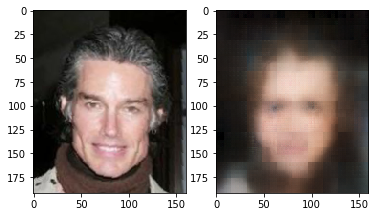

	Epoch 1 batch 1500 loss: 0.024359114468097687
	Epoch 1 batch 2000 loss: 0.023626603186130524


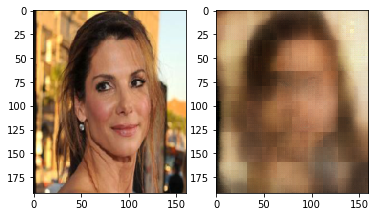

	Epoch 1 batch 2500 loss: 0.022732999175786972
	Epoch 1 batch 3000 loss: 0.02196483127772808


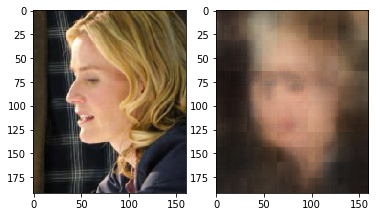

	Epoch 1 batch 3500 loss: 0.02264939248561859
	Epoch 1 batch 4000 loss: 0.021912474185228348


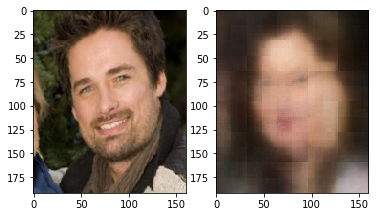

	Epoch 1 batch 4500 loss: 0.02241026982665062
	Epoch 1 batch 5000 loss: 0.021104710176587105


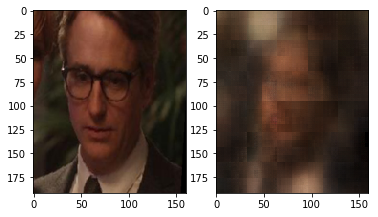

	Epoch 1 batch 5500 loss: 0.02243495173752308
	Epoch 1 batch 6000 loss: 0.0209843497723341


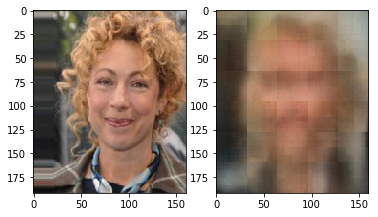

	Epoch 1 batch 6500 loss: 0.020329207181930542
	Epoch 1 batch 7000 loss: 0.019951559603214264


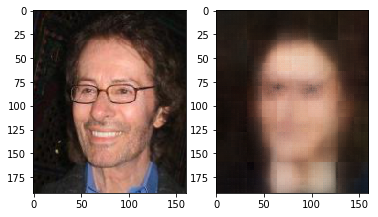

	Epoch 1 batch 7500 loss: 0.018517285585403442
	Epoch 1 batch 8000 loss: 0.020805958658456802


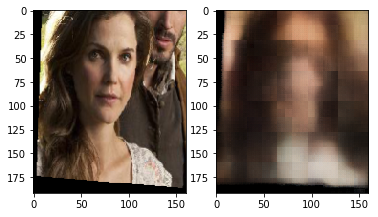

	Epoch 1 batch 8500 loss: 0.022193696349859238
	Epoch 1 batch 9000 loss: 0.02101530134677887


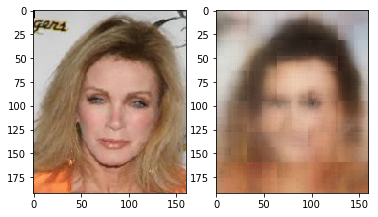

	Epoch 1 batch 9500 loss: 0.021065808832645416
	Epoch 1 batch 10000 loss: 0.018678199499845505


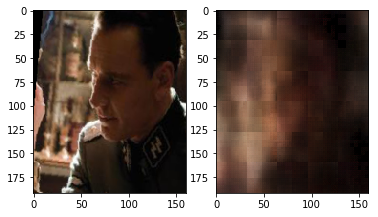

	Epoch 1 batch 10500 loss: 0.019671717658638954
	Epoch 1 batch 11000 loss: 0.019658274948596954


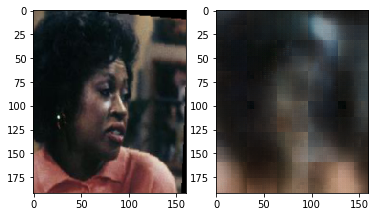

	Epoch 1 batch 11500 loss: 0.018323292955756187
	Epoch 1 batch 12000 loss: 0.016933949664235115


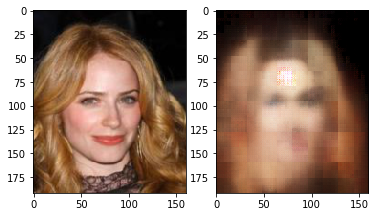

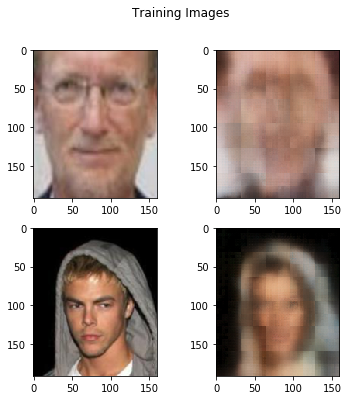

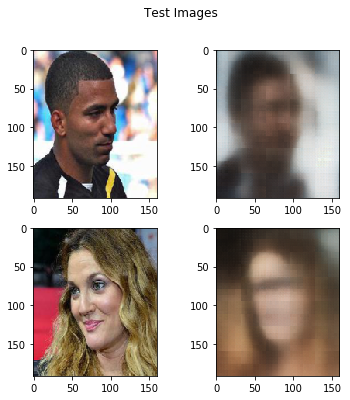

Epoch: 1 Train Loss: 269.4383005052805 Test Loss: 10.697519264183939
Copying file://gen_model_5_var.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

/
Operation completed over 1 objects/422.9 MiB.                                    


In [0]:
# re-train encoder FC layers and full decoder on full datatset for 3 epochs
train(generator, train_loader, g_optimizer, test_loader=test_loader, print_metrics=500, plot_images=1000, num_epochs=1, display_images=1, scheduler=g_scheduler, save_path = "gen_model_5_var.pt")

	Epoch 1 batch 1000 loss: 0.031325213611125946
	Epoch 1 batch 2000 loss: 0.02669922262430191
	Epoch 1 batch 3000 loss: 0.02765599638223648
	Epoch 1 batch 4000 loss: 0.030588017776608467
	Epoch 1 batch 5000 loss: 0.02446131408214569


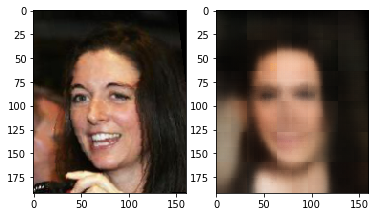

	Epoch 1 batch 6000 loss: 0.02756083756685257
	Epoch 1 batch 7000 loss: 0.028813423588871956
	Epoch 1 batch 8000 loss: 0.030256666243076324
	Epoch 1 batch 9000 loss: 0.027121398597955704
	Epoch 1 batch 10000 loss: 0.03021634742617607


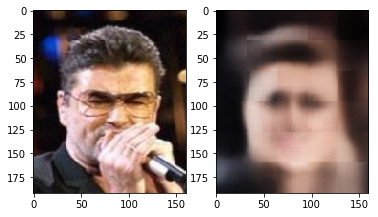

	Epoch 1 batch 11000 loss: 0.03064260259270668
	Epoch 1 batch 12000 loss: 0.02928747981786728


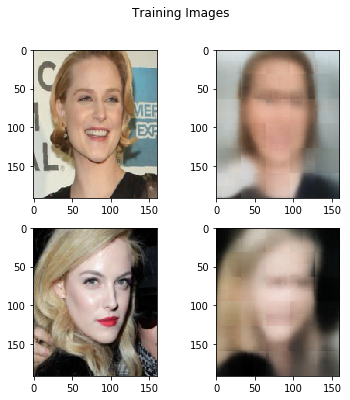

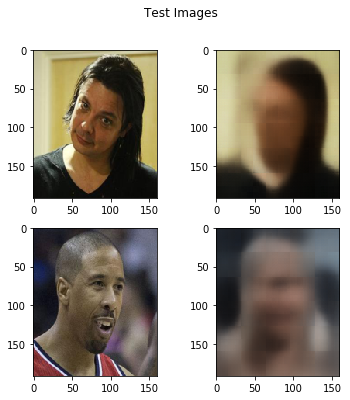

Epoch: 1 Train Loss: 346.37278492935 Test Loss: 17.024857062846422
	Epoch 2 batch 1000 loss: 0.023727674037218094
	Epoch 2 batch 2000 loss: 0.028326362371444702
	Epoch 2 batch 3000 loss: 0.026563871651887894
	Epoch 2 batch 4000 loss: 0.032102443277835846
	Epoch 2 batch 5000 loss: 0.028089262545108795


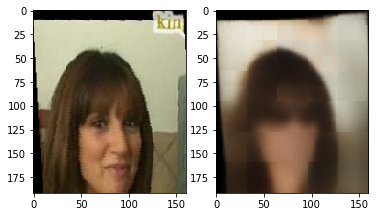

	Epoch 2 batch 6000 loss: 0.024402104318141937
	Epoch 2 batch 7000 loss: 0.028020847588777542
	Epoch 2 batch 8000 loss: 0.029712684452533722
	Epoch 2 batch 9000 loss: 0.02931854873895645
	Epoch 2 batch 10000 loss: 0.025993933901190758


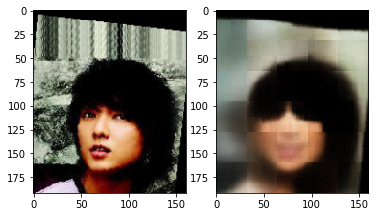

	Epoch 2 batch 11000 loss: 0.027697807177901268
	Epoch 2 batch 12000 loss: 0.02795228362083435


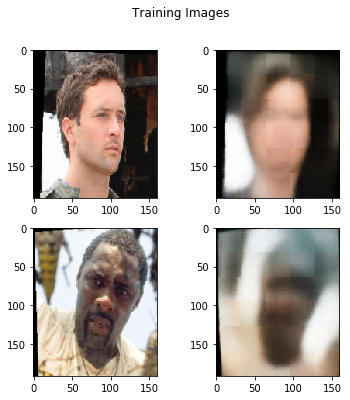

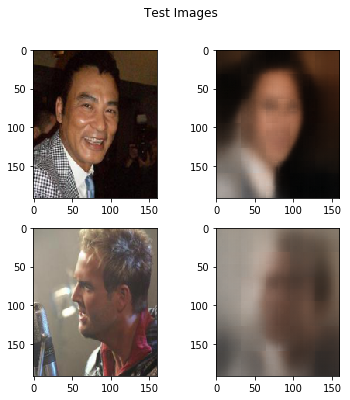

Epoch: 2 Train Loss: 333.6210087519139 Test Loss: 16.950824104249477
	Epoch 3 batch 1000 loss: 0.02434510365128517
	Epoch 3 batch 2000 loss: 0.02877463772892952
	Epoch 3 batch 3000 loss: 0.024964945390820503
	Epoch 3 batch 4000 loss: 0.02874699793756008
	Epoch 3 batch 5000 loss: 0.02875942550599575


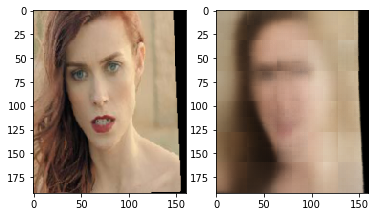

	Epoch 3 batch 6000 loss: 0.025948425754904747
	Epoch 3 batch 7000 loss: 0.027615873143076897
	Epoch 3 batch 8000 loss: 0.027480024844408035
	Epoch 3 batch 9000 loss: 0.029003119096159935
	Epoch 3 batch 10000 loss: 0.02625425159931183


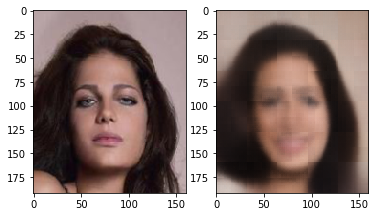

	Epoch 3 batch 11000 loss: 0.02566082775592804
	Epoch 3 batch 12000 loss: 0.027177853509783745


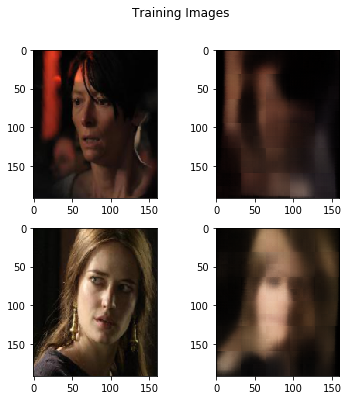

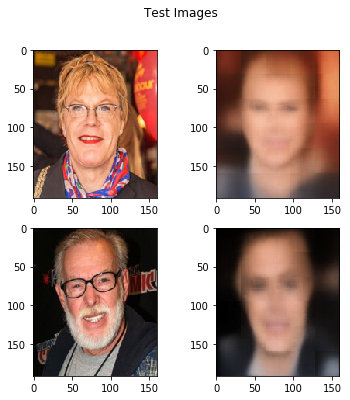

Epoch: 3 Train Loss: 326.79609923250973 Test Loss: 16.636828741058707
Copying file://gen_model_5_var.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

/
Operation completed over 1 objects/422.9 MiB.                                    


In [18]:
# continue to train encoder FC layers and full decoder on full datatset for 3 epochs
train(generator, train_loader, g_optimizer, test_loader=test_loader, print_metrics=1000, plot_images=5000, num_epochs=3, display_images=1, scheduler=g_scheduler, save_path = "gen_model_5_var.pt")

In [0]:
# train entire generator for 2 epochs
train(generator, train_loader, g_optimizer, test_loader=test_loader, print_metrics=2000, plot_images=5000, num_epochs=2, display_images=1, scheduler=g_scheduler, save_path = "gen_model_5_var.pt")

In [0]:
## CHECK MEAN AND VARIANCE OF CODES
with torch.no_grad():
    for (inputs, _) in test_loader:
      generator.encoder.eval()
      generator.decoder.eval()
      # encode the images and reconstruct them
      codes, logvar = generator.encoder(inputs.cuda())
      recon = generator.decoder(codes)
      vae_loss(inputs.cuda(), recon, codes, logvar=logvar)
      print("Mean:", torch.mean(codes))
      print("Std:", codes.std())
      break

MSE: tensor(0.0030, device='cuda:0')
KLD: tensor(34.4174, device='cuda:0')
Mean: tensor(-0.0943, device='cuda:0')
Std: tensor(22.1428, device='cuda:0')


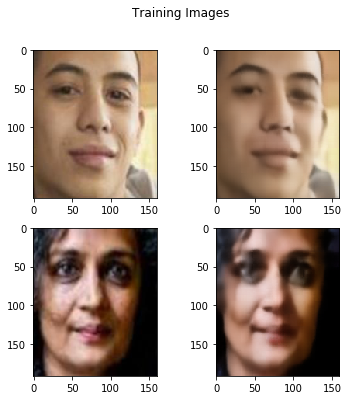

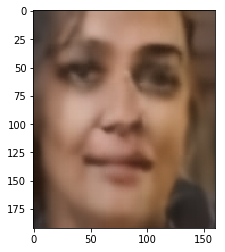

In [0]:
## TRY SOME INTERPOLATION
with torch.no_grad():
    for (inputs, _) in test_loader:
      generator.encoder.eval()
      generator.decoder.eval()
      # encode the images and reconstruct them
      codes, _ = generator.encoder(inputs.cuda())
      recon = generator.decoder(codes)

      # plot the images against their reconstructions
      fig, ax = plt.subplots(2, 2, figsize=(6,6))
      fig.suptitle("Training Images")
      ax[0,0].imshow(inputs[0].cpu().permute(1, 2, 0) )
      ax[0,1].imshow(recon[0].cpu().detach().permute(1, 2, 0) )
      ax[1,0].imshow(inputs[1].cpu().permute(1, 2, 0) )
      ax[1,1].imshow(recon[1].cpu().detach().permute(1, 2, 0) )
      plt.show()
      
      # interpolate the codes
      int_code = (codes[0] + codes[1]) / 2

      # decode the interpolation
      int_recon = generator.decoder(int_code.reshape(1, 4096, 1, 1))

      # plot the reconstruction
      plt.imshow(int_recon[0].cpu().permute(1, 2, 0))
      plt.show()
      break

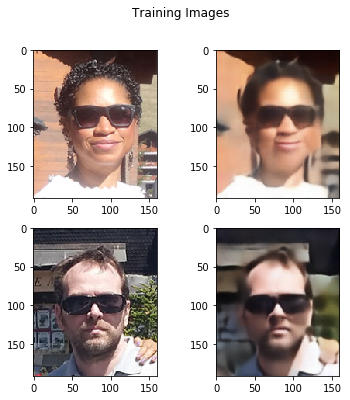

Interrupting... Saving model...


Traceback (most recent call last):
  File "/usr/lib/python3.6/multiprocessing/queues.py", line 240, in _feed
    send_bytes(obj)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken pipe


Copying file://gen_model_5_var.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

|
Operation completed over 1 objects/422.9 MiB.                                    


In [0]:
# fine-tune entire generator for 3 epochs
train(generator, train_loader2, g_optimizer, test_loader=None, print_metrics=2000, plot_images=10000, num_epochs=25, display_images=1, scheduler=g_scheduler, save_path = "gen_model_5_var.pt")

In [0]:
!mkdir data/Train
!cp -r data/images/Training_Pictures data/Train/Images

In [0]:
transform2 = torchvision.transforms.Compose(
    [torchvision.transforms.Resize((192,160)),
      torchvision.transforms.ToTensor(),
    ])

train_dataset2 = torchvision.datasets.ImageFolder(
        root="data/Train",
        transform=transform2
    )

train_loader2 = torch.utils.data.DataLoader(
    train_dataset2,
    batch_size=48,
    num_workers=2,
    shuffle=True
)

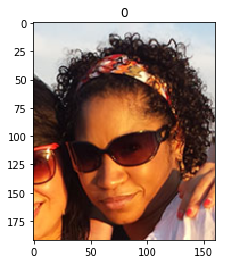

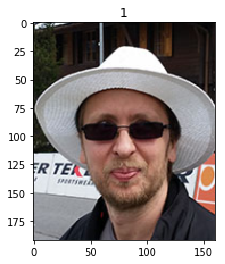

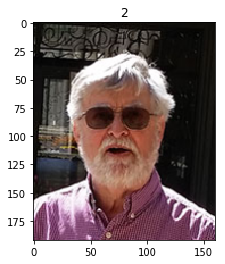

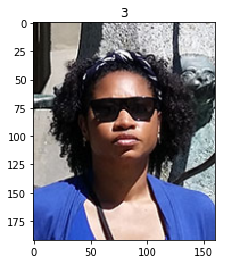

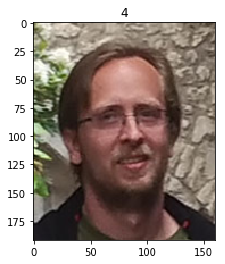

...

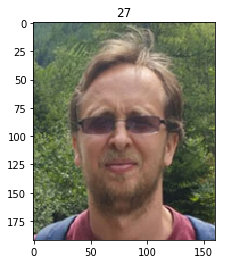

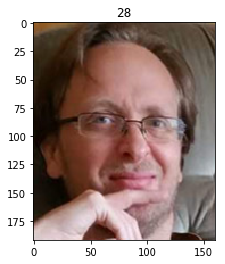

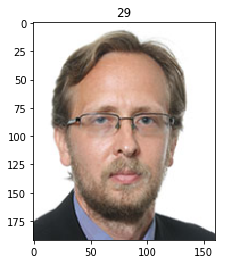

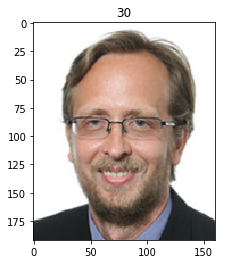

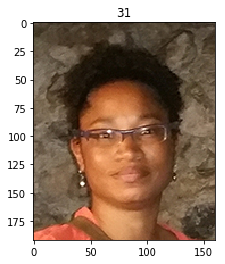

In [0]:
with torch.no_grad():
    for (inputs, _) in train_loader2:
      for i, image in enumerate(inputs):
        plt.imshow(image.cpu().permute(1, 2, 0))
        plt.title(str(i))
        plt.show()
      break

In [0]:
with torch.no_grad():
    for (inputs, _) in train_loader2:
      for i, image in enumerate(inputs):
        generator.encoder.eval()
        generator.decoder.eval()
        # encode the images and reconstruct them
        codes, _ = generator.encoder(inputs.cuda())
        recon = generator.decoder(codes)

        # plot the images against their reconstructions
        fig, ax = plt.subplots(2, 2, figsize=(6,6))
        ax[0,0].imshow(inputs[23].cpu().permute(1, 2, 0) )
        ax[0,1].imshow(recon[23].cpu().detach().permute(1, 2, 0) )
        ax[1,0].imshow(inputs[5].cpu().permute(1, 2, 0) )
        ax[1,1].imshow(recon[5].cpu().detach().permute(1, 2, 0) )
        plt.show()

        # interpolate the codes
        int_code = (codes[23] + codes[5]) / 2

          # decode the interpolation
        int_recon = generator.decoder(int_code.reshape(1, 4096, 1, 1))

        # plot the reconstruction
        plt.imshow(int_recon[0].cpu().permute(1, 2, 0))
        plt.show()
        break
      break

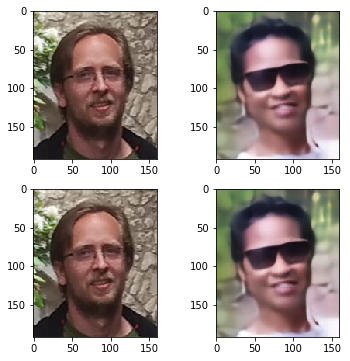

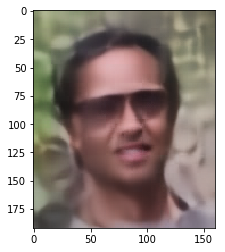

In [0]:
with torch.no_grad():
    for (inputs, _) in train_loader2:
      generator.encoder.eval()
      generator.decoder.eval()
      # encode the images and reconstruct them
      codes, _ = generator.encoder(inputs.cuda())
      recon = generator.decoder(codes)

      # plot the images against their reconstructions
      fig, ax = plt.subplots(2, 2, figsize=(6,6))
      ax[0,0].imshow(inputs[4].cpu().permute(1, 2, 0) )
      ax[0,1].imshow(recon[5].cpu().detach().permute(1, 2, 0) )
      ax[1,0].imshow(inputs[4].cpu().permute(1, 2, 0) )
      ax[1,1].imshow(recon[5].cpu().detach().permute(1, 2, 0) )
      plt.show()

      # interpolate the codes
      int_code = (codes[4] + codes[5]) / 2

        # decode the interpolation
      int_recon = generator.decoder(int_code.reshape(1, 4096, 1, 1))

      # plot the reconstruction
      plt.imshow(int_recon[0].cpu().permute(1, 2, 0))
      plt.show()
      break
     

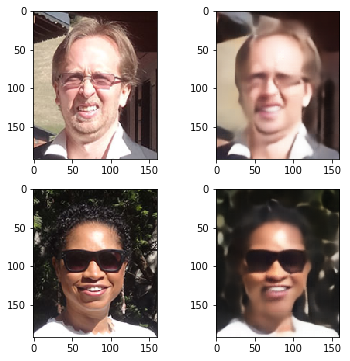

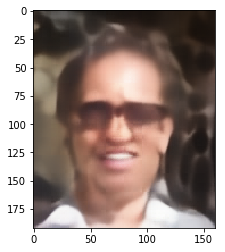

In [0]:
with torch.no_grad():
    for (inputs, _) in train_loader2:
      for i, image in enumerate(inputs):
        generator.encoder.eval()
        generator.decoder.eval()
        # encode the images and reconstruct them
        codes, _ = generator.encoder(inputs.cuda())
        recon = generator.decoder(codes)

        # plot the images against their reconstructions
        fig, ax = plt.subplots(2, 2, figsize=(6,6))
        ax[0,0].imshow(inputs[18].cpu().permute(1, 2, 0) )
        ax[0,1].imshow(recon[18].cpu().detach().permute(1, 2, 0) )
        ax[1,0].imshow(inputs[19].cpu().permute(1, 2, 0) )
        ax[1,1].imshow(recon[19].cpu().detach().permute(1, 2, 0) )
        plt.show()

        # interpolate the codes
        int_code = (codes[18] + codes[19]) / 2

          # decode the interpolation
        int_recon = generator.decoder(int_code.reshape(1, 4096, 1, 1))

        # plot the reconstruction
        plt.imshow(int_recon[0].cpu().permute(1, 2, 0))
        plt.show()
        break
      break

In [0]:
train(model, train_loader=train_loader2, optimizer=optimizer, print_metrics=10, plot_images=1, num_epochs=25, display_images=1, scheduler=scheduler)

In [0]:
train(model, train_loader=train_loader2, optimizer=optimizer, print_metrics=10, plot_images=1, num_epochs=30, display_images=1, scheduler=scheduler)

In [0]:
noise = np.random.normal(loc=0.3, scale=7.5, size=4096).reshape((1,4096,1,1))
image = model.decoder(torch.from_numpy(noise).cuda().float())
plt.imshow(image[0].cpu().detach().permute(1,2,0))
plt.show()

### Training As GAN From Scratch

	Epoch 1 batch 500 gen loss: 7.210885047912598 disc loss: 1.6579269170761108 disc acc: 0.6836743180306054
	Epoch 1 batch 1000 gen loss: 6.770462989807129 disc loss: 1.6756582260131836 disc acc: 0.6838578088578089
	Epoch 1 batch 1500 gen loss: 7.89830207824707 disc loss: 1.9332998991012573 disc acc: 0.6982844770153231
	Epoch 1 batch 2000 gen loss: 7.133177757263184 disc loss: 1.0633344650268555 disc acc: 0.7061365150757954


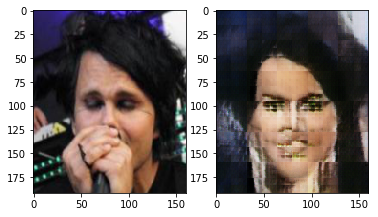

	Epoch 1 batch 2500 gen loss: 8.429205894470215 disc loss: 0.2887933552265167 disc acc: 0.7136062241769958
	Epoch 1 batch 3000 gen loss: 7.924533367156982 disc loss: 0.7715005874633789 disc acc: 0.7251610574253026
	Epoch 1 batch 3500 gen loss: 8.903125762939453 disc loss: 0.6524512767791748 disc acc: 0.743472103208607
	Epoch 1 batch 4000 gen loss: 8.57429027557373 disc loss: 0.4691992998123169 disc acc: 0.7591175122885946


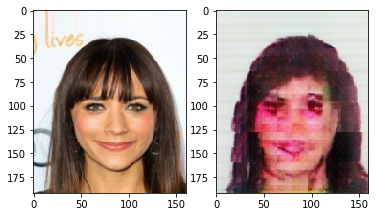

	Epoch 1 batch 4500 gen loss: 14.379009246826172 disc loss: 1.7235194444656372 disc acc: 0.7693197807894542
	Epoch 1 batch 5000 gen loss: 8.624287605285645 disc loss: 0.7286317348480225 disc acc: 0.7795690861827634
	Epoch 1 batch 5500 gen loss: 10.850953102111816 disc loss: 0.1882723867893219 disc acc: 0.790276767860389
	Epoch 1 batch 6000 gen loss: 15.43362045288086 disc loss: 0.009810887277126312 disc acc: 0.7974226517802588


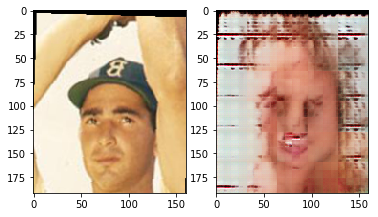

	Epoch 1 batch 6500 gen loss: 10.69955062866211 disc loss: 0.6705272793769836 disc acc: 0.8061804594165
	Epoch 1 batch 7000 gen loss: 13.947137832641602 disc loss: 0.06680843979120255 disc acc: 0.8134790268056943
	Epoch 1 batch 7500 gen loss: 9.115678787231445 disc loss: 1.1059311628341675 disc acc: 0.8208599964449184
	Epoch 1 batch 8000 gen loss: 13.565728187561035 disc loss: 0.14219513535499573 disc acc: 0.8271726450860309


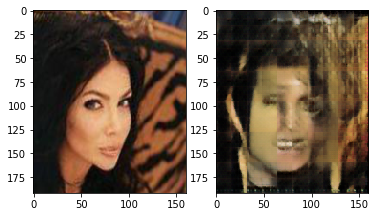

	Epoch 1 batch 8500 gen loss: 12.558538436889648 disc loss: 0.24310940504074097 disc acc: 0.8333725444065404
	Epoch 1 batch 9000 gen loss: 9.869534492492676 disc loss: 0.8728765845298767 disc acc: 0.8380851201718328


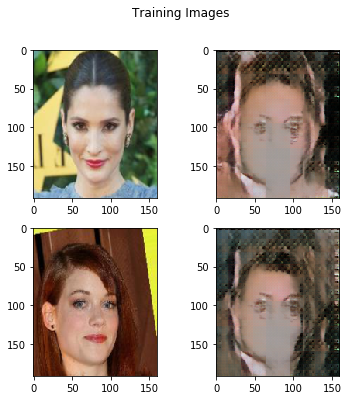

/usr/local/lib/python3.6/dist-packages/numpy/core/fromnumeric.py:3118: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Epoch: 1 Gen Train Loss: 95822.84421873093 Disc Train Loss: 6333.044747937471 Test Loss: 0.0 Avg Tr Disc Acc: 0.8391215151848189 Avg Te Disc Acc: nan
Copying file://gen_model_4_var.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

\
Operation completed over 1 objects/342.9 MiB.                                    
Copying file:

In [0]:
train_discriminator(discriminator, generator, train_loader, d_optimizer=d_optimizer, g_optimizer=g_optimizer, print_metrics=500, extra_gen_train=4, train_gen=True, plot_images=2000, num_epochs=1, display_images=1, g_scheduler=g_scheduler, d_scheduler=d_scheduler, d_save_path="disc_model_4_var.pt", g_save_path="gen_model_4_var.pt")

	Epoch 2 batch 1000 gen loss: 5.3819499015808105 disc loss: 1.2908958196640015 disc acc: 0.7838411588411588
	Epoch 2 batch 2000 gen loss: 5.6435465812683105 disc loss: 1.6640983819961548 disc acc: 0.7847951024487756
	Epoch 2 batch 3000 gen loss: 6.212039470672607 disc loss: 0.5375652313232422 disc acc: 0.7880428745973566
	Epoch 2 batch 4000 gen loss: 7.1829023361206055 disc loss: 0.8956695795059204 disc acc: 0.7860066233441639


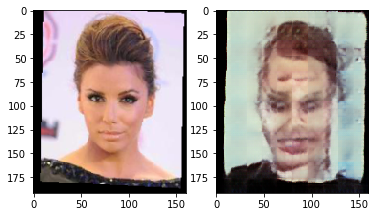

	Epoch 2 batch 5000 gen loss: 7.048419952392578 disc loss: 0.44274502992630005 disc acc: 0.7860636206092114
	Epoch 2 batch 6000 gen loss: 5.9601945877075195 disc loss: 0.8251670002937317 disc acc: 0.78550797089374
	Epoch 2 batch 7000 gen loss: 5.7242608070373535 disc loss: 0.8966543674468994 disc acc: 0.7835428272151597
	Epoch 2 batch 8000 gen loss: 6.1333818435668945 disc loss: 0.774234414100647 disc acc: 0.7852716327125776


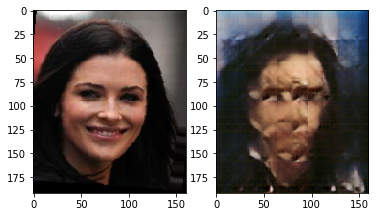

	Epoch 2 batch 9000 gen loss: 5.503388404846191 disc loss: 0.89243084192276 disc acc: 0.7905348479798541


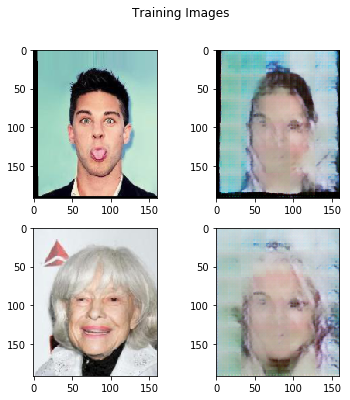

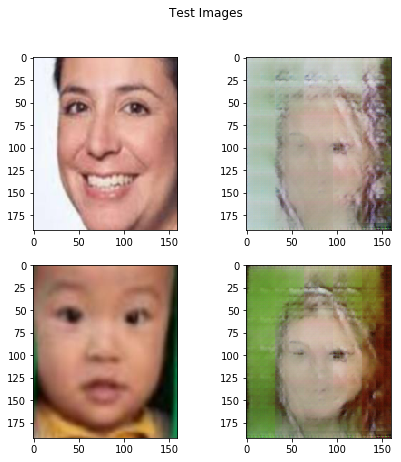

Epoch: 2 Gen Train Loss: 61126.18341064453 Disc Train Loss: 8267.86941172555 Test Loss: 10.311397584155202 Avg Tr Disc Acc: 0.7905836721984101 Avg Te Disc Acc: 0.901582422586521
	Epoch 3 batch 1000 gen loss: 5.84865665435791 disc loss: 0.7855291962623596 disc acc: 0.8154137529137528
	Epoch 3 batch 2000 gen loss: 6.917616844177246 disc loss: 0.7026419639587402 disc acc: 0.818215892053973
	Epoch 3 batch 3000 gen loss: 8.640765190124512 disc loss: 0.5286402702331543 disc acc: 0.8225799733422192
	Epoch 3 batch 4000 gen loss: 9.215493202209473 disc loss: 0.20527765154838562 disc acc: 0.8353015912688494


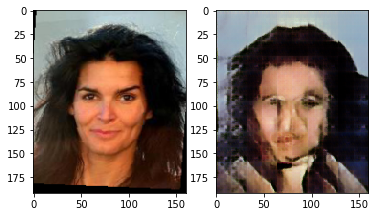

	Epoch 3 batch 5000 gen loss: 10.816120147705078 disc loss: 0.503442108631134 disc acc: 0.8381323735252949
Interrupting... Saving model...
Copying file://gen_model_4_var.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

\
Operation completed over 1 objects/342.9 MiB.                                    
Copying file://disc_mode

In [0]:
train_discriminator(discriminator, generator, train_loader, test_loader=test_loader, d_optimizer=d_optimizer, g_optimizer=g_optimizer, num_epochs=3, print_metrics=1000, extra_gen_train=8, train_gen=True, plot_images=4000, display_images=1, g_scheduler=g_scheduler, d_scheduler=d_scheduler, d_save_path="disc_model_4_var.pt", g_save_path="gen_model_4_var.pt")

	Epoch 0 batch 1000 gen loss: 9.772945404052734 disc loss: 0.35218241810798645 disc acc: 0.8663003663003662
	Epoch 0 batch 2000 gen loss: 9.934879302978516 disc loss: 0.914099931716919 disc acc: 0.8775299850074962
	Epoch 0 batch 3000 gen loss: 12.336318969726562 disc loss: 1.4988582134246826 disc acc: 0.8810882483616571
	Epoch 0 batch 4000 gen loss: 11.433664321899414 disc loss: 0.2672469913959503 disc acc: 0.8765256602516037


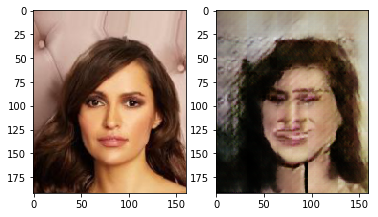

	Epoch 0 batch 5000 gen loss: 14.783821105957031 disc loss: 0.3428935408592224 disc acc: 0.8786201093114709
	Epoch 0 batch 6000 gen loss: 9.776773452758789 disc loss: 0.3642280697822571 disc acc: 0.8791277842581792
	Epoch 0 batch 7000 gen loss: 12.683481216430664 disc loss: 0.1528722196817398 disc acc: 0.8823174070370898
	Epoch 0 batch 8000 gen loss: 11.77851676940918 disc loss: 0.3144085109233856 disc acc: 0.885001353997417


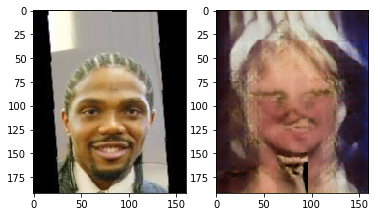

	Epoch 0 batch 9000 gen loss: 12.432112693786621 disc loss: 0.38679608702659607 disc acc: 0.8843230381809428


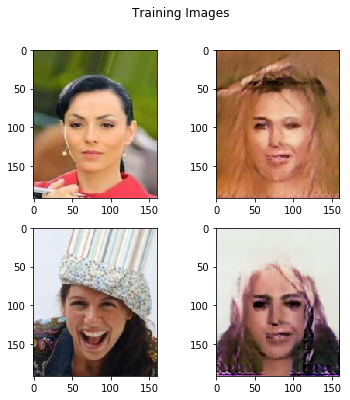

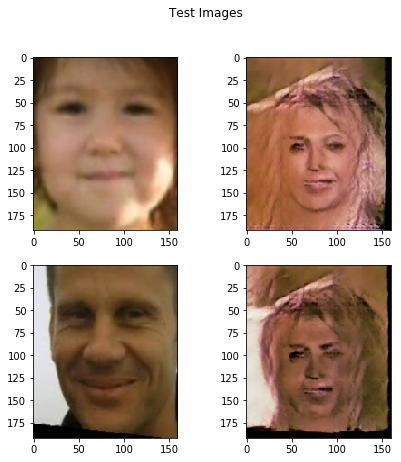

Epoch: 0 Gen Train Loss: 108087.20547866821 Disc Train Loss: 5019.938339971937 Test Loss: 10.90946089476347 Avg Tr Disc Acc: 0.8842658751969513 Avg Te Disc Acc: 1.1346197632058286
	Epoch 1 batch 1000 gen loss: 13.81229305267334 disc loss: 0.15618765354156494 disc acc: 0.8833458208458208
	Epoch 1 batch 2000 gen loss: 14.064586639404297 disc loss: 0.12073853611946106 disc acc: 0.8787064800932867
	Epoch 1 batch 3000 gen loss: 13.111284255981445 disc loss: 0.17931900918483734 disc acc: 0.877513051205154
	Epoch 1 batch 4000 gen loss: 13.00253677368164 disc loss: 0.22544200718402863 disc acc: 0.8741668749479298


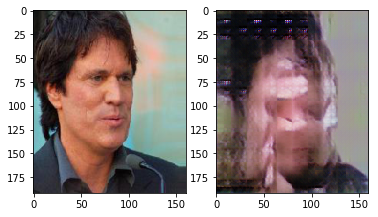

	Epoch 1 batch 5000 gen loss: 10.595739364624023 disc loss: 0.6660259962081909 disc acc: 0.875741518362994
	Epoch 1 batch 6000 gen loss: 13.163219451904297 disc loss: 0.3039323389530182 disc acc: 0.8805997611509193
	Epoch 1 batch 7000 gen loss: 11.694473266601562 disc loss: 0.31612420082092285 disc acc: 0.8840701328381659
	Epoch 1 batch 8000 gen loss: 11.295654296875 disc loss: 0.7008695602416992 disc acc: 0.8871963921176519


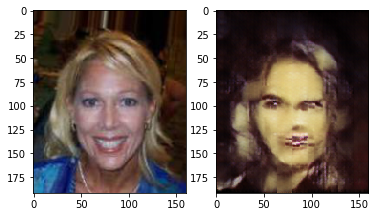

	Epoch 1 batch 9000 gen loss: 11.376203536987305 disc loss: 0.5963401794433594 disc acc: 0.8855775284227678


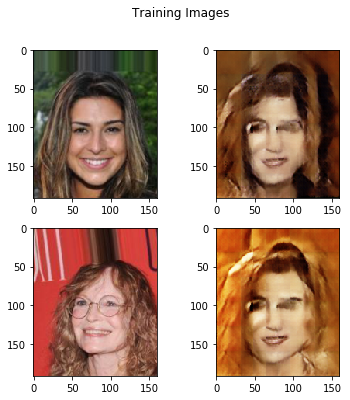

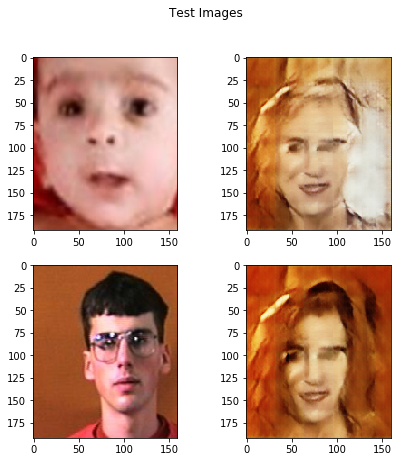

Epoch: 1 Gen Train Loss: 113653.0845155716 Disc Train Loss: 4912.296317458153 Test Loss: 11.67997313477099 Avg Tr Disc Acc: 0.8858598072624674 Avg Te Disc Acc: 0.9993169398907104
	Epoch 2 batch 1000 gen loss: 15.567350387573242 disc loss: 1.6071760654449463 disc acc: 0.8826798201798202
Interrupting... Saving model...
Copying file://gen_model_4_var.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite o

In [0]:
train_discriminator(discriminator, generator, train_loader, test_loader=test_loader, d_optimizer=d_optimizer, g_optimizer=g_optimizer, num_epochs=3, print_metrics=1000, extra_gen_train=12, train_gen=True, plot_images=4000, display_images=1, g_scheduler=g_scheduler, d_scheduler=d_scheduler, d_save_path="disc_model_4_var.pt", g_save_path="gen_model_4_var.pt")

	Epoch 2 batch 1000 gen loss: 15.905111312866211 disc loss: 0.2739022374153137 disc acc: 0.890984015984016
	Epoch 2 batch 2000 gen loss: 12.941478729248047 disc loss: 0.618680477142334 disc acc: 0.9164896718307513
	Epoch 2 batch 3000 gen loss: 18.748517990112305 disc loss: 0.06066477298736572 disc acc: 0.9151671665000555
	Epoch 2 batch 4000 gen loss: 16.678993225097656 disc loss: 0.14178185164928436 disc acc: 0.9172238190452386


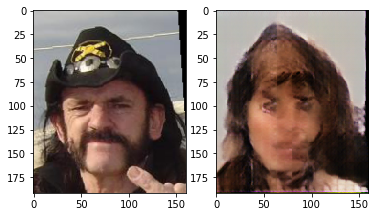

	Epoch 2 batch 5000 gen loss: 16.580612182617188 disc loss: 0.46417221426963806 disc acc: 0.9228237685796173
	Epoch 2 batch 6000 gen loss: 16.668373107910156 disc loss: 0.08985263109207153 disc acc: 0.9246688051991335
	Epoch 2 batch 7000 gen loss: 16.02007484436035 disc loss: 0.38135501742362976 disc acc: 0.9228830405180213
	Epoch 2 batch 8000 gen loss: 18.642250061035156 disc loss: 0.08255903422832489 disc acc: 0.922665916760405


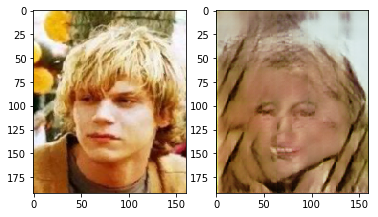

	Epoch 2 batch 9000 gen loss: 17.047550201416016 disc loss: 0.1994810551404953 disc acc: 0.9238880865089063


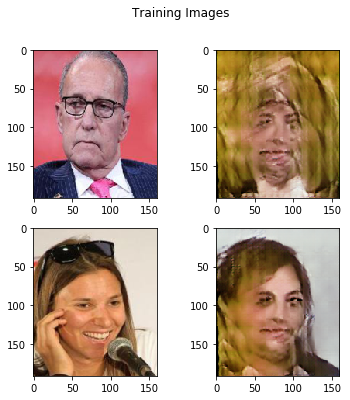

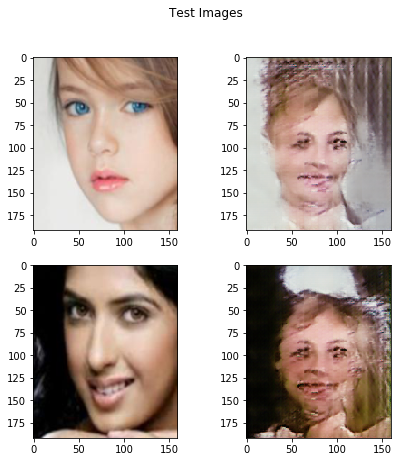

Epoch: 2 Gen Train Loss: 148783.73027706146 Disc Train Loss: 3428.2345378315076 Test Loss: 11.545321479439735 Avg Tr Disc Acc: 0.9240912755120735 Avg Te Disc Acc: 0.6894353369763205
	Epoch 3 batch 1000 gen loss: 16.687528610229492 disc loss: 0.4993169903755188 disc acc: 0.9127331002331003
Interrupting... Saving model...
Copying file://gen_model_4_var.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composit

In [0]:
train_discriminator(discriminator, generator, train_loader, test_loader=test_loader, d_optimizer=d_optimizer, g_optimizer=g_optimizer, num_epochs=3, print_metrics=1000, extra_gen_train=12, train_gen=True, plot_images=4000, display_images=1, g_scheduler=g_scheduler, d_scheduler=d_scheduler, d_save_path="disc_model_4_var.pt", g_save_path="gen_model_4_var.pt")

	Epoch 3 batch 1000 loss: 0.02802431210875511
	Epoch 3 batch 2000 loss: 0.028808435425162315


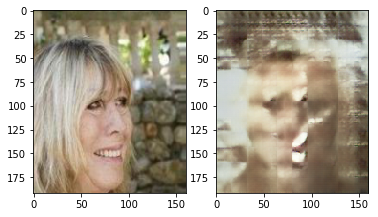

	Epoch 3 batch 3000 loss: 0.026192057877779007
	Epoch 3 batch 4000 loss: 0.02361687459051609


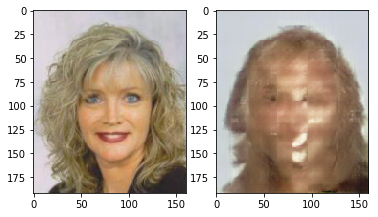

	Epoch 3 batch 5000 loss: 0.019360654056072235
	Epoch 3 batch 6000 loss: 0.019098609685897827


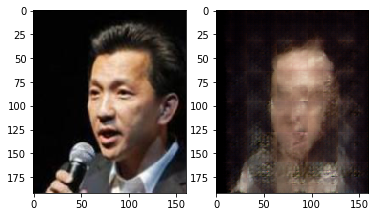

	Epoch 3 batch 7000 loss: 0.014844881370663643
	Epoch 3 batch 8000 loss: 0.015349900349974632


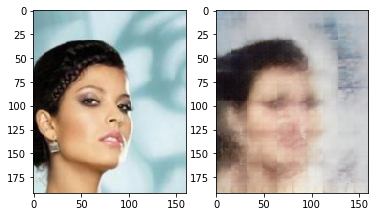

	Epoch 3 batch 9000 loss: 0.017731957137584686


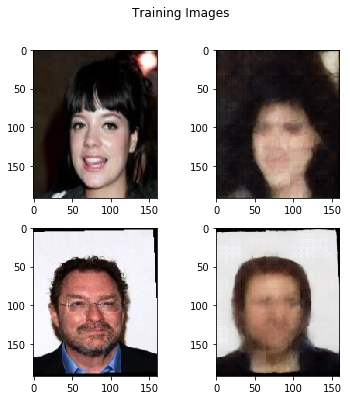

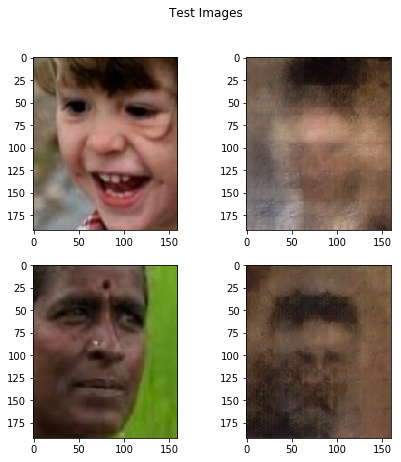

Epoch: 3 Train Loss: 199.6107844505459 Test Loss: 3.835004105232656
	Epoch 4 batch 1000 loss: 0.012974932789802551
	Epoch 4 batch 2000 loss: 0.012474354356527328


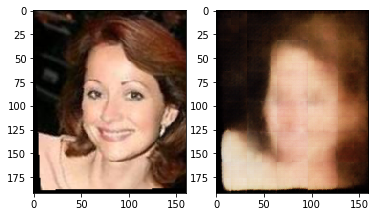

	Epoch 4 batch 3000 loss: 0.012112345546483994
	Epoch 4 batch 4000 loss: 0.01135927252471447


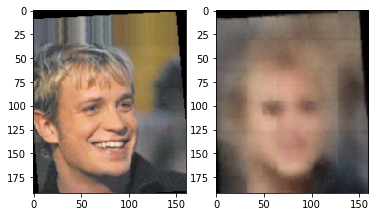

	Epoch 4 batch 5000 loss: 0.012154895812273026
Interrupting... Saving model...
Copying file://gem_model_4_var.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

/
Operation completed over 1 objects/342.9 MiB.                                    


In [0]:
train(generator, train_loader, g_optimizer, test_loader=test_loader, print_metrics=1000, plot_images=2000, num_epochs=3, display_images=1, scheduler=g_scheduler, save_path = "gem_model_4_var.pt")